In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
from superRes.metrics import *


import torchvision
import geffnet # efficient/ mobile net

In [2]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.9):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=20)

In [3]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'

path_lowRes_256 = path/'DIV2K_train_LR_256_QF20'
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
path_lowRes_Full = path/'DIV2K_train_LR_Full_QF20'

proj_id = 'unet_superRes_mobilenetV3_MSE'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

In [4]:
model = geffnet.mobilenetv3_rw

In [5]:
# loss_func = FeatureLoss()
# loss_func = msssim
# loss_func = fid
loss_func = F.mse_loss

# 256px

In [6]:
bs=10
sz=256
lr = 1e-2
wd = 1e-3
epochs = 1

In [7]:
data_gen = get_DIV2k_data_QF(path_lowRes_256, path_fullRes, bs=bs, sz=sz)

In [8]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [9]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(LPIPS_Metric_gen())
learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [10]:
wandbCallbacks = False

if wandbCallbacks:
    import wandb
    from wandb.fastai import WandbCallback
    config={"batch_size": bs,
            "img_size": (sz, sz),
            "learning_rate": lr,
            "weight_decay": wd,
            "num_epochs": epochs
    }
    wandb.init(project='SuperRes', config=config, id="unet_superRes_mobilenetV3_FID"+ datetime.now().strftime('_%m-%d_%H:%M'))

    learn_gen.callback_fns.append(partial(WandbCallback, input_type='images'))

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


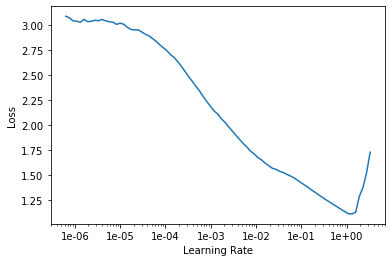

In [11]:
learn_gen.lr_find()
learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.717431,0.168968,0.487613,0.320788,0.296606,0.163731,79.317328,82.143303,79.548818,20.258942,20.955393,19.608082,02:24
1,0.224086,0.093513,0.353082,0.320788,0.194394,0.163731,80.885797,82.143303,79.548818,21.354321,20.955393,19.608082,02:07
2,0.105897,0.078144,0.328126,0.320788,0.178899,0.163731,80.087733,82.143303,79.548818,21.975086,20.955393,19.608082,02:09
3,0.076991,0.069587,0.313905,0.320788,0.167098,0.163731,80.343315,82.143303,79.548818,22.139952,20.955393,19.608082,02:07
4,0.069260,0.066516,0.310157,0.320788,0.165491,0.163731,80.730411,82.143303,79.548818,21.940350,20.955393,19.608082,02:06


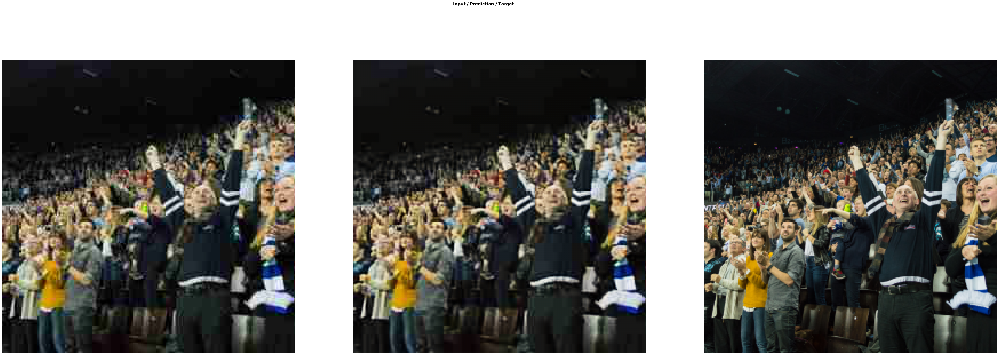

In [10]:
do_fit(learn_gen, 5, gen_name+"_256px_0", slice(lr*10))

In [11]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.066138,0.065527,0.308746,0.320788,0.164681,0.163731,80.490850,82.143303,79.548818,21.948769,20.955393,19.608082,02:10
1,0.066292,0.066159,0.309093,0.320788,0.161759,0.163731,80.613766,82.143303,79.548818,21.752480,20.955393,19.608082,02:08
2,0.066130,0.068875,0.317601,0.320788,0.159251,0.163731,82.687120,82.143303,79.548818,21.477154,20.955393,19.608082,02:05
3,0.064140,0.253693,0.336061,0.320788,0.183111,0.163731,80.735151,82.143303,79.548818,21.913568,20.955393,19.608082,02:08
4,0.064281,0.064400,0.303071,0.320788,0.157435,0.163731,81.185260,82.143303,79.548818,21.756653,20.955393,19.608082,02:06


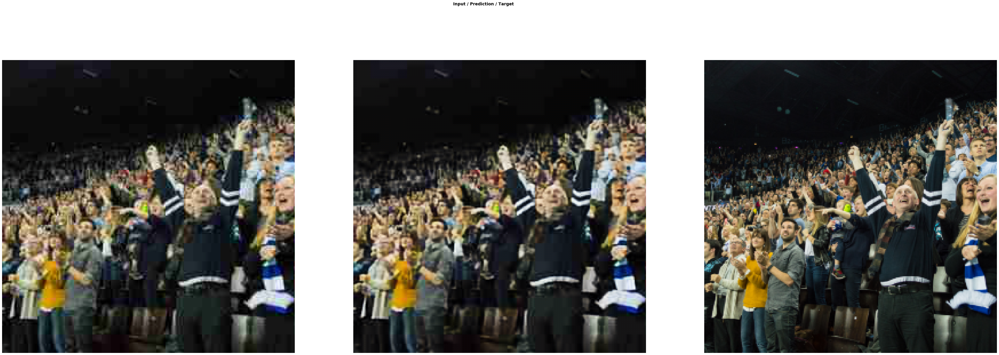

In [12]:
do_fit(learn_gen, 5, gen_name+"_256px_1", lr)

# 512px

In [13]:
bs=4
sz=512
epochs = 1

In [14]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [15]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

6508

In [14]:
learn_gen.load(gen_name+"_256px_1")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
           

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


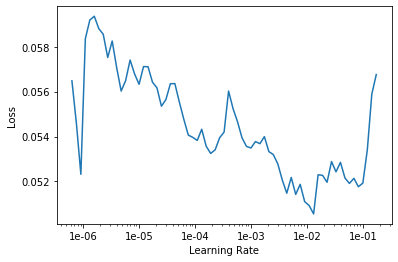

In [16]:
learn_gen.lr_find()
learn_gen.recorder.plot()

Upsize to gen_512


epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.054244,0.045395,0.283284,0.299631,0.172283,0.178643,88.455690,88.881953,86.438728,17.450380,17.855345,15.694710,11:37
1,0.050100,0.045116,0.283443,0.299631,0.170038,0.178643,89.144447,88.881953,86.438728,17.545286,17.855345,15.694710,11:46
2,0.055559,0.044732,0.280747,0.299631,0.172368,0.178643,88.454123,88.881953,86.438728,17.506769,17.855345,15.694710,11:35


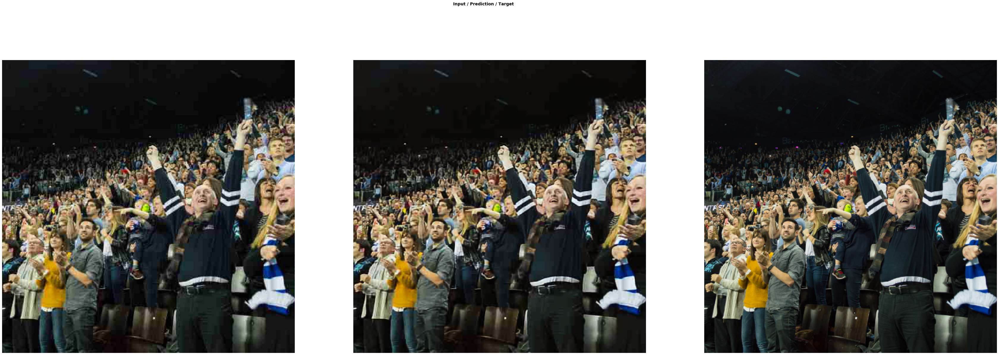

In [17]:
print("Upsize to gen_512")

do_fit(learn_gen, 3, gen_name+"_512px_0", slice(1e-2))

In [18]:
learn_gen.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


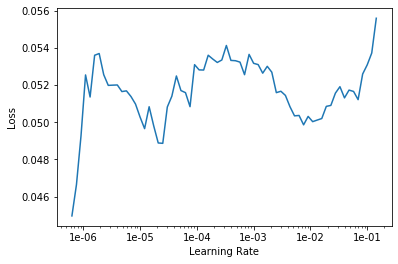

In [19]:
learn_gen.lr_find()
learn_gen.recorder.plot()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.053412,0.044606,0.280464,0.299631,0.171978,0.178643,88.558514,88.881953,86.438728,17.519253,17.855345,15.694710,11:24
1,0.050159,0.044994,0.280777,0.299631,0.171741,0.178643,88.210566,88.881953,86.438728,17.452248,17.855345,15.694710,11:19
2,0.049140,0.044798,0.280488,0.299631,0.171665,0.178643,88.371653,88.881953,86.438728,17.461296,17.855345,15.694710,11:20


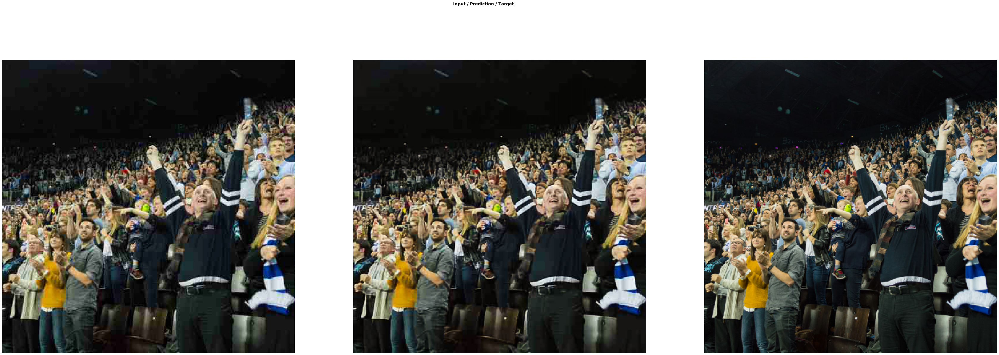

In [20]:
do_fit(learn_gen, 3, gen_name+"_512px_1", 1e-5)

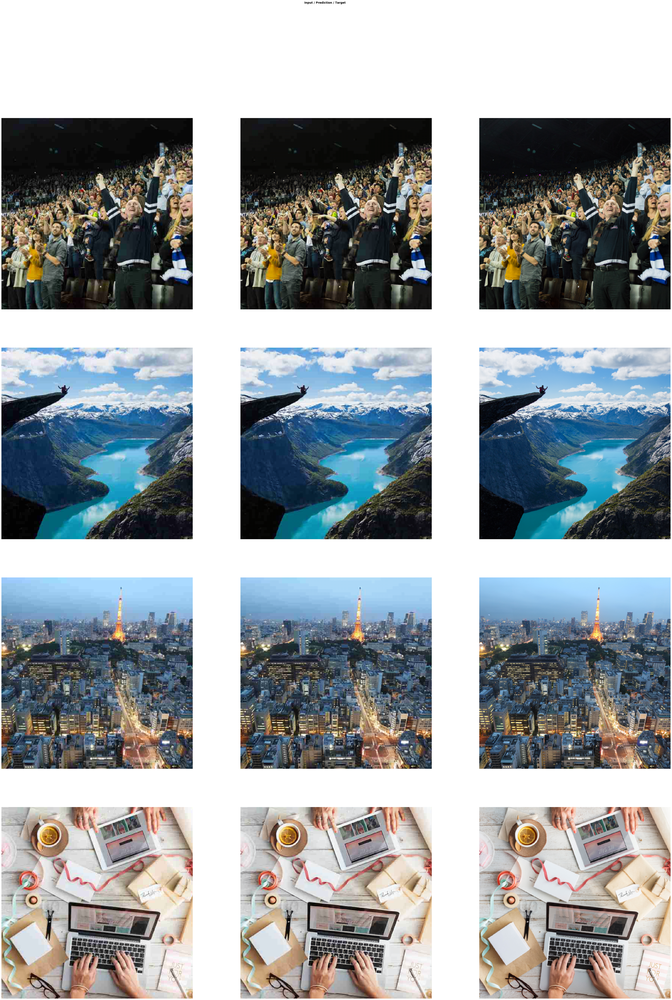

In [21]:
learn_gen.show_results(rows=10, imgsize=20)

In [ ]:
learn_gen = None
gc.collect()